# ETA Project
By Yihnew Eshetu

# Create TFIDF, perform PCA, Generate Word Embeddings and Perform Sentiment Analysis

In [2]:
import re
import os
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import plotly_express as px
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

from glob import glob
from pathlib import Path
from scipy.linalg import norm
from nltk.corpus import stopwords
from gensim.models import word2vec
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
from nltk.stem.porter import PorterStemmer

### OHCO Level

In [3]:
OHCO = ['file_id', 'company', 'title', 'speaker', 'sent_num', 'token_num']
SENTS = OHCO[:5]
SPEAKER = OHCO[:4]
TITLE = OHCO[:3]
COMPANY = OHCO[:2]
FILE = OHCO[:1]

### Tables

In [4]:
DOC = pd.read_csv('dataset/processed-files/final/DOC.csv') 
LIB = pd.read_csv('dataset/processed-files/final/LIB.csv')
TOKEN = pd.read_csv('dataset/processed-files/final/TOKEN.csv')
VOCAB = pd.read_csv('dataset/processed-files/final/VOCAB.csv')

In [6]:
LIB[LIB['year'] == 2010].count()

file_id      78
file_name    78
company      78
title        78
date         78
year         78
dtype: int64

### Create Transcript Table

In [4]:
# Create a Transcript table that contains text of each transcript and some meta data
transcript = DOC.groupby(FILE)['line_str'].apply(lambda x: ' '.join(x)).to_frame().reset_index()
transcript = pd.merge(left = LIB, right = transcript, left_on = 'file_id', right_on = 'file_id')
transcript = transcript.rename(columns={"line_str": "text"})
# Rearrange columns
transcript = transcript[['file_id', 'file_name', 'company', 'title', 'date', 'year', 'text']]
transcript.head()

,file_id,file_name,company,title,date,year,text
0,575f8b498cfe5b23768b45e8,Cisco/575f8b498cfe5b23768b45e8_CSCO.txt,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,"May 20, 2016",2016,"Thank you for taking the question. Chuck, I wa..."
1,575f8b708cfe5b23768b4c08,Cisco/575f8b708cfe5b23768b4c08_CSCO.txt,Cisco,Cisco Systems Inc at Bank of America Merrill L...,"Jun 2, 2016",2016,"Yeah, of course. Thank you Tal. So I'd be remi..."
2,575f8b988cfe5beb7f8b458b,Cisco/575f8b988cfe5beb7f8b458b_CSCO.txt,Cisco,Scientific-Atlanta Inc. at The Brean Murray & ...,"Feb 2, 2005",2005,I think the probability is very small and the ...
3,575f8bfe8cfe5beb7f8b5088,Cisco/575f8bfe8cfe5beb7f8b5088_CSCO.txt,Cisco,Scientific-Atlanta Inc. 2005 Financial Analyst...,"Apr 6, 2005",2005,Is this thing working? I'm looking right at my...
4,575f8c218cfe5beb7f8b53aa,Cisco/575f8c218cfe5beb7f8b53aa_CSCO.txt,Cisco,Cisco Systems at Nasdaq/Morgan Stanley 14th In...,"Feb 25, 2005",2005,"To answer the first one, I definitely see the ..."


## Computer TFIDF

In [5]:
from nltk.corpus import wordnet as wn
from nltk.corpus import sentiwordnet as swn
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

In [6]:
def tfidf(TOKEN, bag, count_method, tf_method, idf_method):
    # Bag of Words
    BOW = TOKEN.groupby(bag+['term_id']).term_id.count().to_frame().rename(columns={'term_id':'n'})
    BOW['c'] = BOW.n.astype('bool').astype('int')
    
    # Document Count Matrix
    DTCM = BOW[count_method].unstack().fillna(0).astype('int')

    # Compute TF
    tf_norm_k = .5
    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()
    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()
    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)
    elif tf_method == 'raw':
        TF = DTCM.T
    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming
    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    TF = TF.T
    
    # Compute DF
    DF = DTCM[DTCM > 0].count()
    
    # Compute IDF
    N = DTCM.shape[0]
    if idf_method == 'standard':
        IDF = np.log10(N / DF)
    elif idf_method == 'max':
        IDF = np.log10(DF.max() / DF) 
    elif idf_method == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF)) + 1 # Correct?
    
    # TFIDF
    TFIDF = TF * IDF
    return TFIDF

if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

### Using transcript as the bag

In [7]:
TFIDF_Transcript = tfidf(TOKEN, FILE, 'n', 'sum', 'standard')
gradient_cmap = 'YlGnBu'
VOCAB['tfidf_sum_transcript'] = TFIDF_Transcript.sum()
VOCAB[['term_rank','term_str','pos_max','tfidf_sum_transcript']].sort_values('tfidf_sum_transcript', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum_transcript
term_id,,,,
21201,36,quarter,NN,0.527229
5763,212,cisco,NNP,0.437065
10797,378,fios,NNP,0.370514
13434,267,inaudible,JJ,0.363635
29071,200,wireless,NN,0.331173
28175,360,verizon,NNP,0.323512
5958,258,cloud,NN,0.301275
17744,142,network,NN,0.290432
14162,250,inventory,NN,0.283608


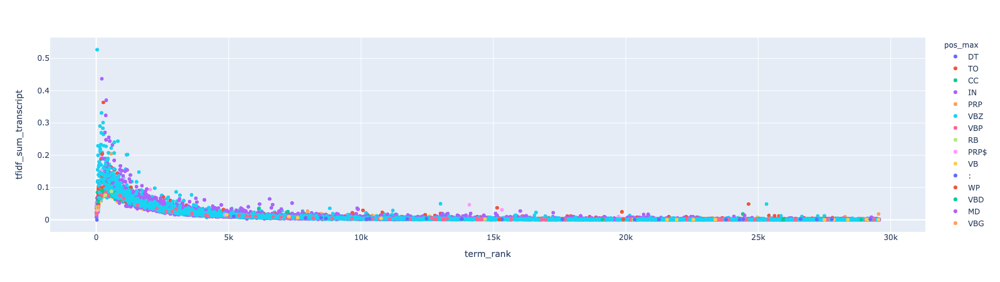

In [8]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum_transcript', hover_name='term_str', hover_data=['n'], color='pos_max')

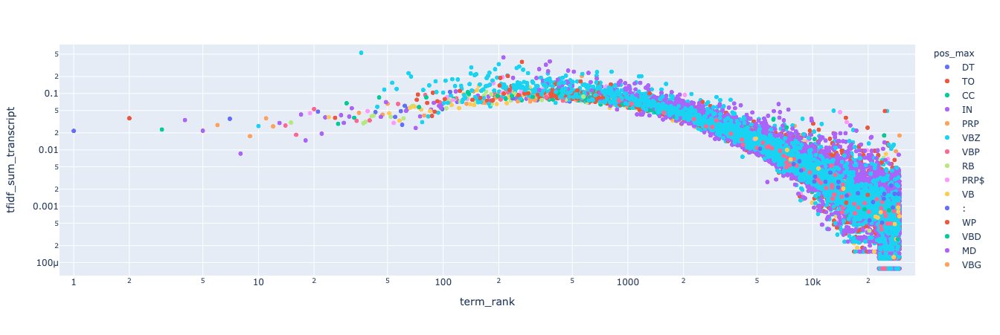

In [9]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum_transcript', 
           hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=True, log_y=True)

In [10]:
# Save tfidf
TFIDF_Transcript.to_csv('dataset/processed-files/final/TFIDF.csv', index=False)

## Clustering of Documents

In [11]:
def pairs(TFIDF, bag, metric = ''):
    TFIDF = TFIDF.groupby(bag).mean()
    D = TFIDF.reset_index()[bag]
    D.index.name = 'doc_id'
    D['title'] = LIB['title']
    D['year'] = LIB.year
    
    # norm vector matrix
    L0 = TFIDF.astype('bool').astype('int')
    L1 = TFIDF.apply(lambda x: x / x.sum(), 1)
    L2 = TFIDF.apply(lambda x: x / norm(x), 1)
    
    # compare
    PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([D.index.tolist(), D.index.tolist()])).reset_index()
    PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
    PAIRS.index.names = ['doc_a', 'doc_b']
    
    # distance measure
    metric = metric.lower()
    if metric == 'cityblock':
        PAIRS.loc[:, metric] = pdist(TFIDF, 'cityblock')
    elif metric == 'euclidean':
        PAIRS.loc[:, metric] =  pdist(TFIDF, 'euclidean')
    elif metric == 'cosine':
        PAIRS.loc[:, metric] =  pdist(TFIDF, 'cosine')
    elif metric == 'jaccard':
        PAIRS.loc[:, metric] =  pdist(L0, 'jaccard')
    elif metric == 'dice':
        PAIRS.loc[:, metric] =  pdist(L0, 'dice')
    elif metric == 'jensenshannon':
        PAIRS.loc[:, metric] =  pdist(L1, 'jensenshannon')
    elif metric == 'euclidean2':
        PAIRS.loc[:, metric] =  pdist(L2, 'euclidean')
    elif metric == 'correlation':
        PAIRS.loc[:, metric] =  pdist(L2, 'correlation')
    
    return PAIRS, D

In [12]:
metrics = ['euclidean', 'cosine', 'jaccard', 'correlation']

def multipMetric(array):
    matrix, document = pairs(TFIDF_Transcript, FILE)
    for metric in metrics:
        matrix.loc[:, metric], doc = pairs(TFIDF_Transcript, FILE, metric)
    return matrix, document

matrix, document = multipMetric(metrics)
matrix

euclidean    cosine   jaccard  correlation
doc_a doc_b                                            
0     1       0.017444  0.829450  0.729560     0.838559
      2       0.037186  0.978779  0.892917     0.984611
      3       0.026252  0.955071  0.837883     0.961871
      4       0.013597  0.922123  0.757248     0.940310
      5       0.016416  0.934332  0.746460     0.946896
...                ...       ...       ...          ...
1189  1191    0.040260  0.972894  0.779030     0.981178
      1192    0.021272  0.940220  0.751469     0.952008
1190  1191    0.040382  0.969941  0.767213     0.977442
      1192    0.021724  0.957075  0.755751     0.967975
1191  1192    0.043229  0.976883  0.788276     0.983421

[711028 rows x 4 columns]

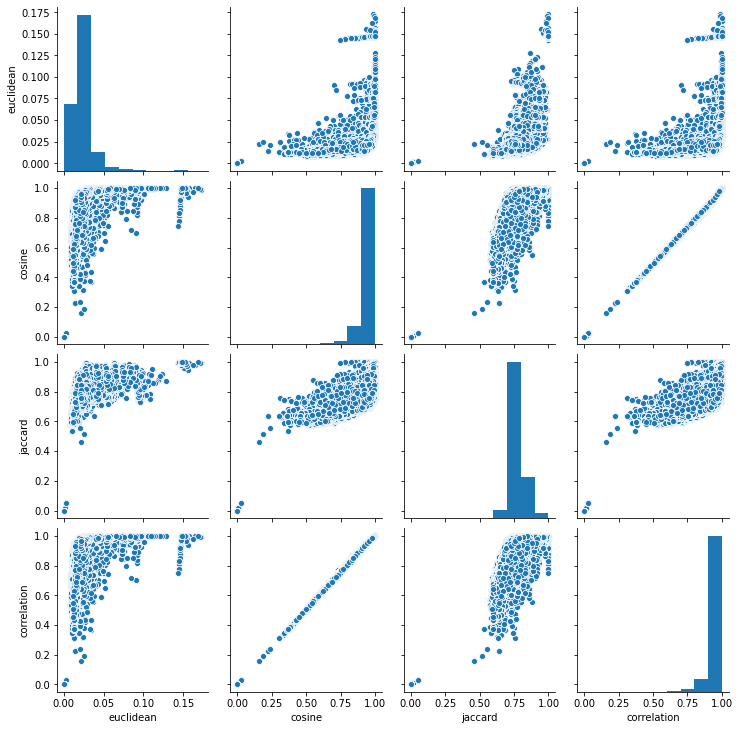

In [13]:
sns.pairplot(matrix)

In [14]:
matrix.to_csv('dataset/processed-files/final/PAIRWISE_DIST.csv', index=False)

### Hierarchial Clustering

In [15]:
def hca(distype, year, linkage_method='ward', color_thresh=.3, figsize=(10, 20)):
    docyear = document[document.year == year]
    PAIRSYEAR = matrix[matrix.index.isin(docyear.index.to_list(), level = 1)]
    PAIRSYEAR = PAIRSYEAR[PAIRSYEAR.index.isin(docyear.index.to_list(), level = 0)]
    sims = PAIRSYEAR[distype]
   
    tree = sch.linkage(sims, method=linkage_method)
    
    labels = docyear.title.values
    
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    axes.set_title(sims.name.title())
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

#### 2010 Transcripts

<Figure size 432x288 with 0 Axes>

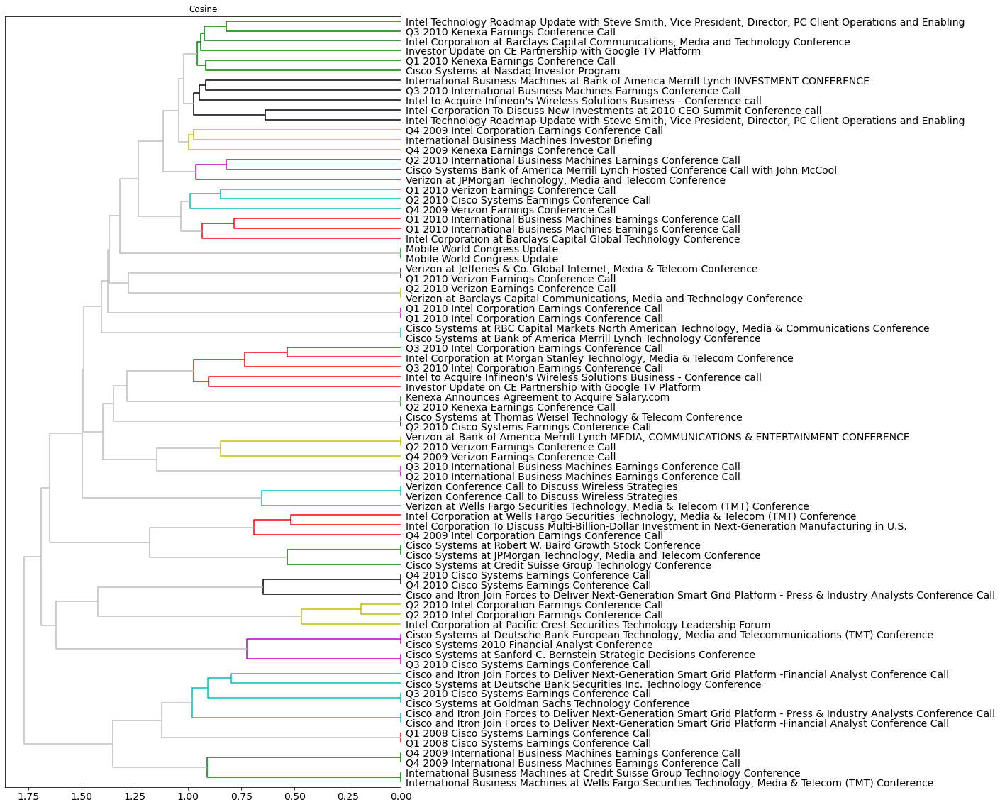

In [448]:
# Cosine
hca('cosine', 2010, color_thresh = 1)

<Figure size 432x288 with 0 Axes>

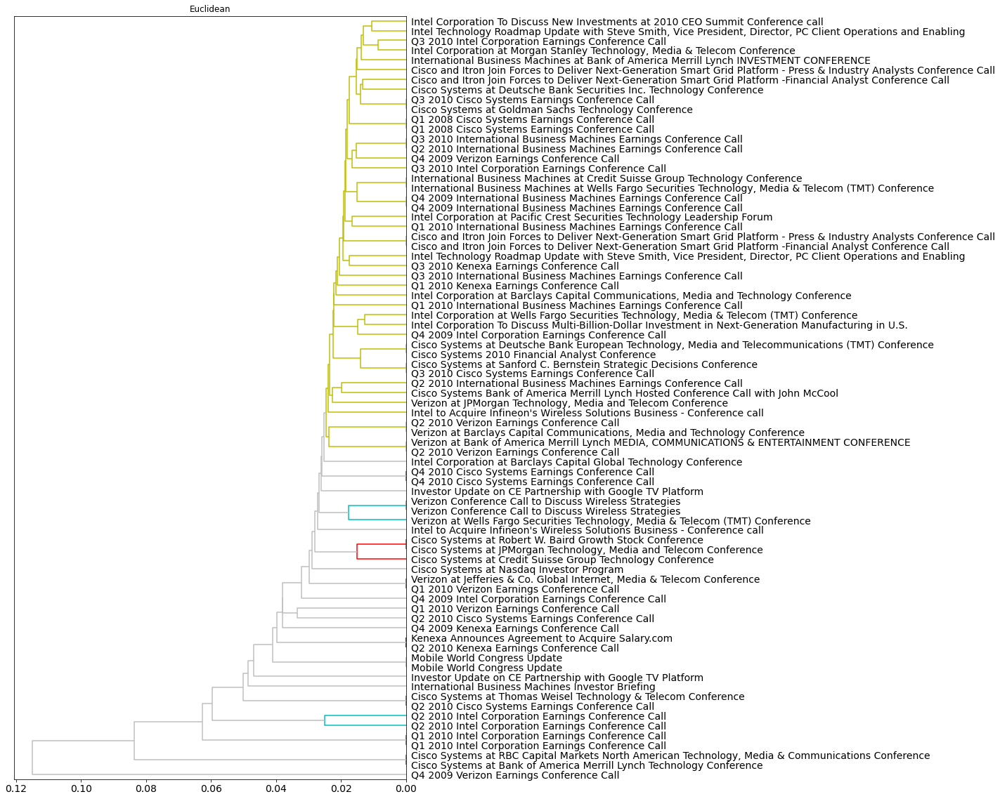

In [17]:
hca('euclidean', 2010, color_thresh = .025)

## Principal Component Analysis

In [18]:
pca_engine = PCA(n_components=10)
DCM = pd.DataFrame(pca_engine.fit_transform(TFIDF_Transcript))
DCM.columns = ['PC{}'.format(i) for i in DCM.columns]

In [19]:
# add file_id as columns
DCM['file_id'] = document['file_id']

In [20]:
DCM = DCM.merge(LIB, on='file_id')
DCM

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,file_id,file_name,company,title,date,year
0,-0.000332,-0.000177,-0.000189,-0.000160,-0.000189,-0.000209,-0.000132,-0.000293,0.001053,0.000010,575f8b498cfe5b23768b45e8,Cisco/575f8b498cfe5b23768b45e8_CSCO.txt,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,"May 20, 2016",2016
1,-0.000239,-0.000150,-0.000102,-0.000100,0.000328,-0.000438,-0.000368,-0.000081,0.000785,0.001380,575f8b708cfe5b23768b4c08,Cisco/575f8b708cfe5b23768b4c08_CSCO.txt,Cisco,Cisco Systems Inc at Bank of America Merrill L...,"Jun 2, 2016",2016
2,-0.000288,0.000127,-0.000086,-0.000089,-0.000138,-0.000340,-0.000844,0.003118,-0.001502,0.000402,575f8b988cfe5beb7f8b458b,Cisco/575f8b988cfe5beb7f8b458b_CSCO.txt,Cisco,Scientific-Atlanta Inc. at The Brean Murray & ...,"Feb 2, 2005",2005
3,0.000899,0.000098,0.001717,0.000229,0.000145,-0.000322,-0.000501,0.000566,-0.003199,0.001643,575f8be58cfe5beb7f8b4e28,Verizon/575f8be58cfe5beb7f8b4e28_VZ.txt,Verizon,Verizon at Raymond James Annual Institutional ...,"Mar 7, 2005",2005
4,-0.000179,-0.000009,-0.000021,-0.000037,-0.000083,-0.000199,-0.000103,0.000981,-0.000500,0.000314,575f8bfe8cfe5beb7f8b5088,Cisco/575f8bfe8cfe5beb7f8b5088_CSCO.txt,Cisco,Scientific-Atlanta Inc. 2005 Financial Analyst...,"Apr 6, 2005",2005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1188,0.000178,-0.000115,-0.000132,-0.000105,0.000508,-0.000419,-0.000176,0.000105,0.000784,0.000932,5914ab606bfe093e698b4567,Intel/5914ab606bfe093e698b4567_INTC.txt,Intel,Intel Corp at Deutsche Bank AutoTech Conference,"May 17, 2017",2017
1189,-0.000325,-0.000223,-0.000062,0.000186,-0.000201,-0.000365,-0.000292,-0.000132,-0.002300,0.000617,591c5f366bfe09f6098b4567,Verizon/591c5f366bfe09f6098b4567_VZ.txt,Verizon,Verizon Communications Inc at MoffettNathanson...,"May 18, 2017",2017
1190,-0.000292,-0.000200,-0.000160,-0.000161,-0.000171,-0.000172,-0.000192,-0.000394,0.000879,-0.000170,591cbed66bfe09106c8b4568,Cisco/591cbed66bfe09106c8b4568_CSCO.txt,Cisco,Q3 2017 Cisco Systems Inc Earnings Call,"May 24, 2017",2017
1191,-0.000339,-0.000260,-0.000167,-0.000236,0.000245,-0.000264,-0.000573,-0.000693,0.001830,0.001206,591dc9516bfe097c388b4567,IBM/591dc9516bfe097c388b4567_IBM.txt,IBM,International Business Machines Corp at Bank o...,"May 24, 2017",2017


### Create Loadings table

In [21]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS.index.name = 'term_id'
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
0,-6.615691e-19,-2.170649e-18,-4.202164e-20,-1.634138e-19,-4.196393e-20,-5.230028e-20,-3.196654e-19,8.660227e-20,-1.291142e-19,-1.037980e-19
1,-5.229120e-07,-9.980279e-08,-4.171268e-07,-4.471706e-07,-5.134689e-07,-7.991127e-07,-6.704261e-07,-1.085390e-06,1.703455e-06,-8.374715e-07
2,-1.426830e-07,-2.934458e-07,-3.037446e-07,-3.130813e-07,-3.348815e-07,3.535609e-07,4.473856e-07,-7.469655e-07,2.219838e-06,-2.499339e-06
3,-7.257869e-09,2.087698e-08,-1.038169e-08,-1.974757e-08,1.826544e-08,-1.266586e-07,-1.324148e-07,4.743850e-09,-9.297338e-08,5.793372e-07
4,-4.905913e-08,-3.825238e-08,-3.696047e-08,-4.273014e-08,-6.375805e-08,-2.851636e-08,-3.105778e-08,1.116319e-07,1.876055e-07,-9.935688e-08
...,...,...,...,...,...,...,...,...,...,...
29565,-9.655075e-08,-4.154332e-08,-6.322882e-08,-4.147693e-08,-1.114536e-08,9.182403e-08,-4.391540e-07,1.516034e-06,3.219383e-07,1.330233e-06
29566,-8.581248e-09,-8.172675e-08,8.197770e-08,-6.544483e-08,-1.641041e-07,1.552383e-07,-1.675698e-07,8.669510e-07,-1.094337e-06,2.210597e-07
29567,-1.718597e-07,-2.106657e-07,-1.406552e-07,-1.617468e-07,-7.624191e-08,5.782611e-07,-8.102371e-07,3.691473e-06,2.719720e-07,2.203381e-06


In [22]:
LOADINGS['term_str'] = VOCAB.sort_index()['term_str']
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
term_id,,,,,,,,,,,
0,-6.615691e-19,-2.170649e-18,-4.202164e-20,-1.634138e-19,-4.196393e-20,-5.230028e-20,-3.196654e-19,8.660227e-20,-1.291142e-19,-1.037980e-19,NaN
1,-5.229120e-07,-9.980279e-08,-4.171268e-07,-4.471706e-07,-5.134689e-07,-7.991127e-07,-6.704261e-07,-1.085390e-06,1.703455e-06,-8.374715e-07,0
2,-1.426830e-07,-2.934458e-07,-3.037446e-07,-3.130813e-07,-3.348815e-07,3.535609e-07,4.473856e-07,-7.469655e-07,2.219838e-06,-2.499339e-06,00
3,-7.257869e-09,2.087698e-08,-1.038169e-08,-1.974757e-08,1.826544e-08,-1.266586e-07,-1.324148e-07,4.743850e-09,-9.297338e-08,5.793372e-07,0001
4,-4.905913e-08,-3.825238e-08,-3.696047e-08,-4.273014e-08,-6.375805e-08,-2.851636e-08,-3.105778e-08,1.116319e-07,1.876055e-07,-9.935688e-08,0004
...,...,...,...,...,...,...,...,...,...,...,...
29565,-9.655075e-08,-4.154332e-08,-6.322882e-08,-4.147693e-08,-1.114536e-08,9.182403e-08,-4.391540e-07,1.516034e-06,3.219383e-07,1.330233e-06,ãââwill
29566,-8.581248e-09,-8.172675e-08,8.197770e-08,-6.544483e-08,-1.641041e-07,1.552383e-07,-1.675698e-07,8.669510e-07,-1.094337e-06,2.210597e-07,ãââyesãââ
29567,-1.718597e-07,-2.106657e-07,-1.406552e-07,-1.617468e-07,-7.624191e-08,5.782611e-07,-8.102371e-07,3.691473e-06,2.719720e-07,2.203381e-06,ãââyou


In [23]:
pc0_pos = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
pc0_neg = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
pc1_pos = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')
pc1_neg = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')

In [24]:
print('PAPERS PC0+', pc0_pos)
print('PAPERS PC0-', pc0_neg)
print('PAPERS PC1+', pc1_pos)
print('PAPERS PC1-', pc1_neg)

PAPERS PC0+ sir inaudible yes questions any audio inaccessible microphone cuts ends
PAPERS PC0- fios quarter cisco signings wireless cloud verizon wireline performance currency
PAPERS PC1+ difficulty technical upstairs stumble silos production savings hardest conrad pleasantly
PAPERS PC1- sir fios star quarter wireline wireless inventory lte roaming signings


In [25]:
LOADINGS.to_csv('dataset/processed-files/final/LOADINGS.csv', index=False)

### Visualize PCA

In [26]:
def pca_viz(M, pc1, pc2, label='company', prefix='PC'):
    fig = px.scatter(M, prefix + str(pc1), prefix + str(pc2), 
                        color=label, 
                        hover_name='title', marginal_x='box')
    plt.savefig('PCA')
    fig.show()

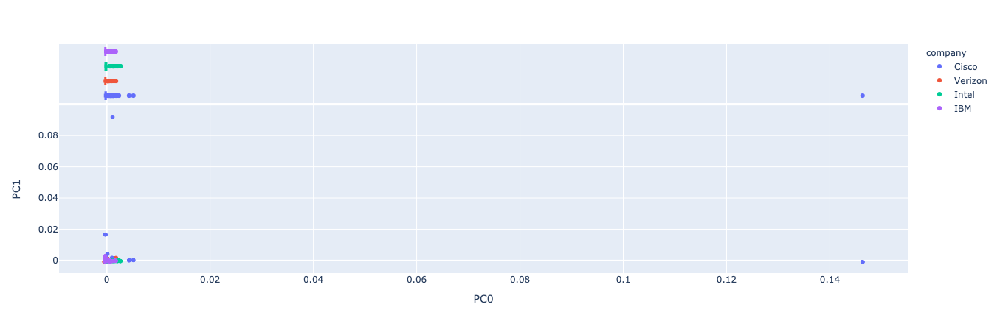

<Figure size 432x288 with 0 Axes>

In [449]:
# By Company all years
pca_viz(DCM, 0, 1)

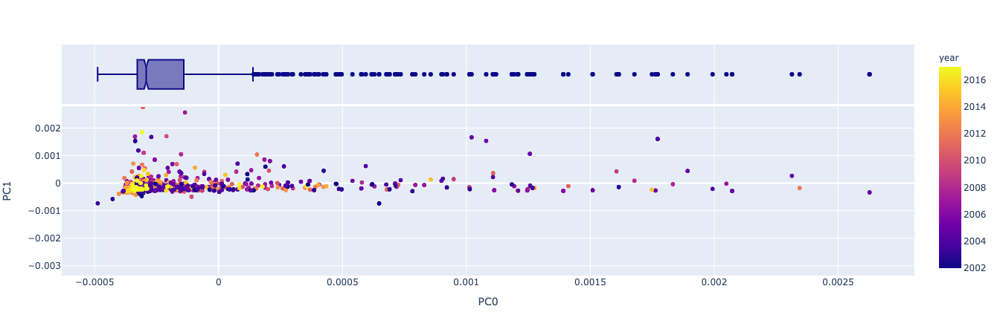

<Figure size 432x288 with 0 Axes>

In [450]:
# By Year all companies
pca_viz(DCM, 0, 1, 'year')

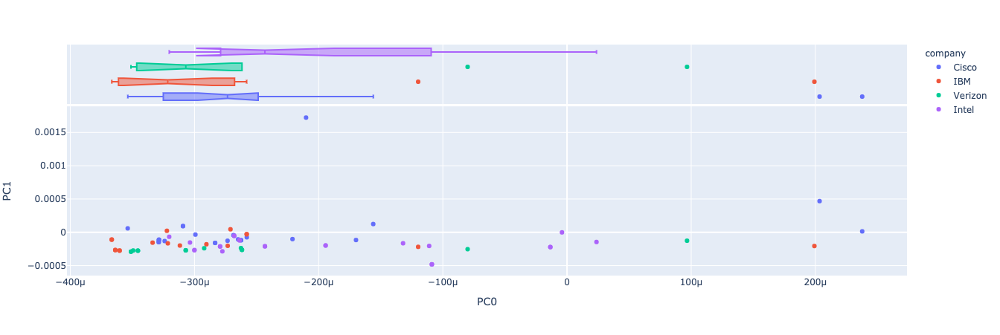

<Figure size 432x288 with 0 Axes>

In [29]:
# By Company, 2010
pca_viz(DCM[DCM['year'] == 2010], 0, 1)

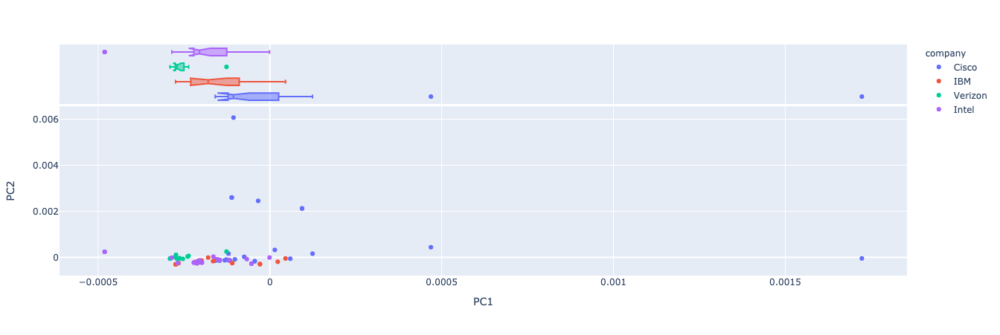

<Figure size 432x288 with 0 Axes>

In [30]:
# By Company, 2010
pca_viz(DCM[DCM['year'] == 2010], 1, 2)

## Word Embeddings

In [31]:
TOKEN['term_str'] = TOKEN['term_str'].astype('str')

In [32]:
# Select each company
CISCO = TOKEN[TOKEN.company == 'Cisco'].set_index(COMPANY)
IBM = TOKEN[TOKEN.company == 'IBM'].set_index(COMPANY)
VERIZON = TOKEN[TOKEN.company == 'Verizon'].set_index(COMPANY)
INTEL = TOKEN[TOKEN.company == 'Intel'].set_index(COMPANY)

In [33]:
def gensim(token):
    corpus = token[~token.pos.str.match('NNPS?')]\
    .groupby(COMPANY)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()
    return corpus

In [34]:
allgenism = gensim(TOKEN)
ciscogenism = gensim(CISCO)
ibmgenism = gensim(IBM)
verizongenism = gensim(VERIZON)
intelgenism = gensim(INTEL)

In [35]:
## Generate create a word2vec model for each corpus
allmodel = word2vec.Word2Vec(allgenism, size=246, window=5, min_count=200, workers=4)
ciscomodel = word2vec.Word2Vec(ciscogenism, size=246, window=5, min_count=200, workers=4)
ibmmodel = word2vec.Word2Vec(ibmgenism, size=246, window=5, min_count=200, workers=4)
verizonmodel = word2vec.Word2Vec(verizongenism, size=246, window=5, min_count=200, workers=4)
intelmodel = word2vec.Word2Vec(intelgenism, size=246, window=5, min_count=200, workers=4)

In [36]:
## Create a t-SNE scatter plot for each model
from sklearn.manifold import TSNE
def plot(model, save = False):
    ### Generate coordinates to plot
    coords = pd.DataFrame(index=range(len(model.wv.vocab)))
    coords['label'] = [w for w in model.wv.vocab]
    coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))
    
    ### Use ScikitLearn's TSNE library
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    tsne_values = tsne_model.fit_transform(coords['vector'].tolist())
    
    coords['x'] = tsne_values[:,0]
    coords['y'] = tsne_values[:,1]
    
    if save:
        coords.to_csv('dataset/processed-files/final/EMBEDDINGS.csv', index=False)
    ### Plot the coordinates
    return px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

In [37]:
# t-SNE Plots of all companies and by each company

In [38]:
#plot(allmodel, True)

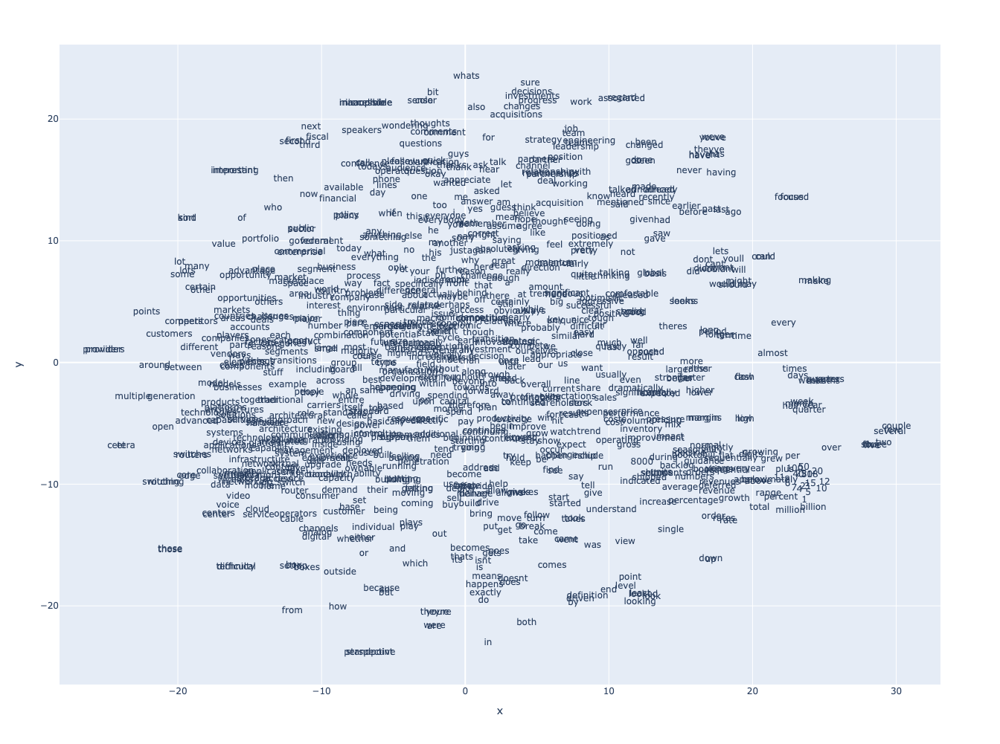

In [39]:
plot(ciscomodel)

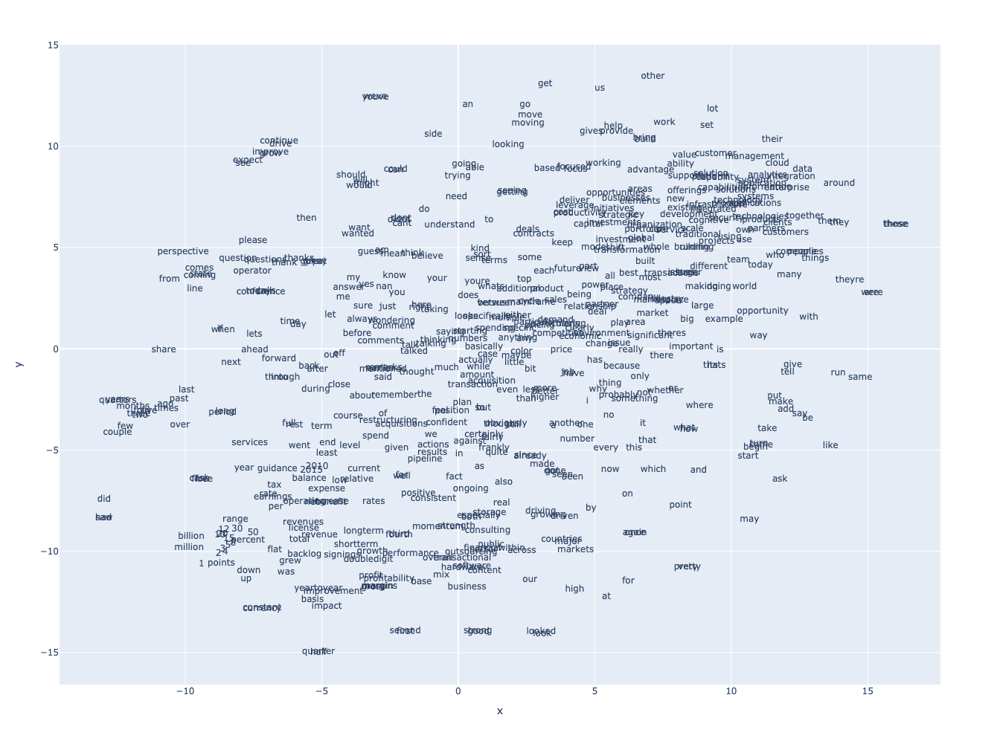

In [40]:
plot(ibmmodel)

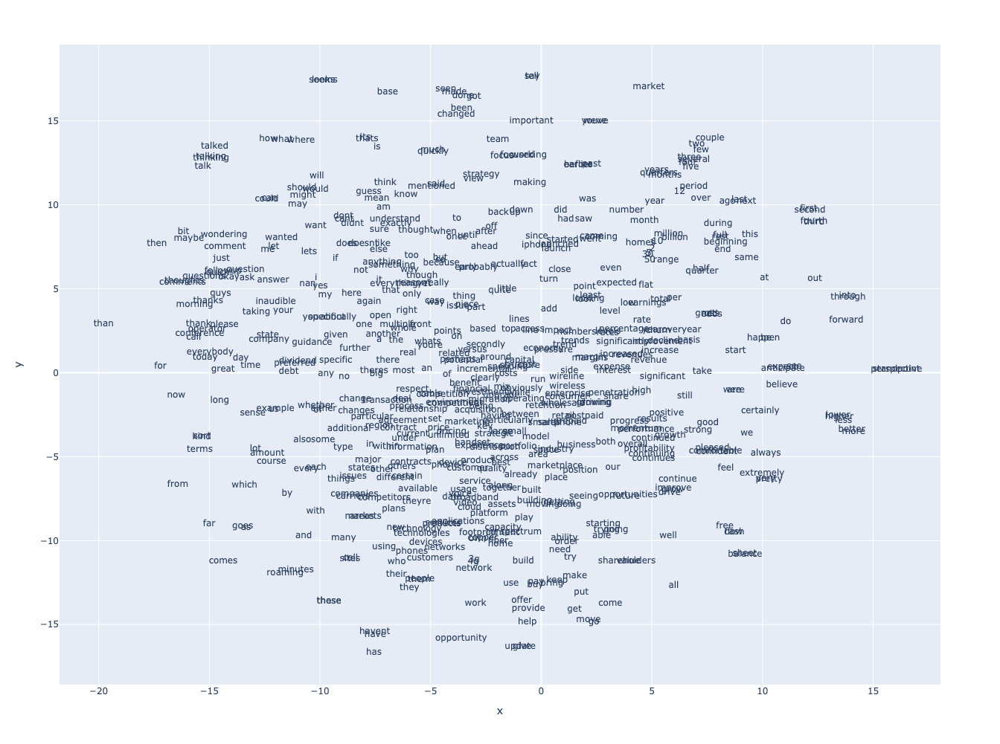

In [41]:
plot(verizonmodel)

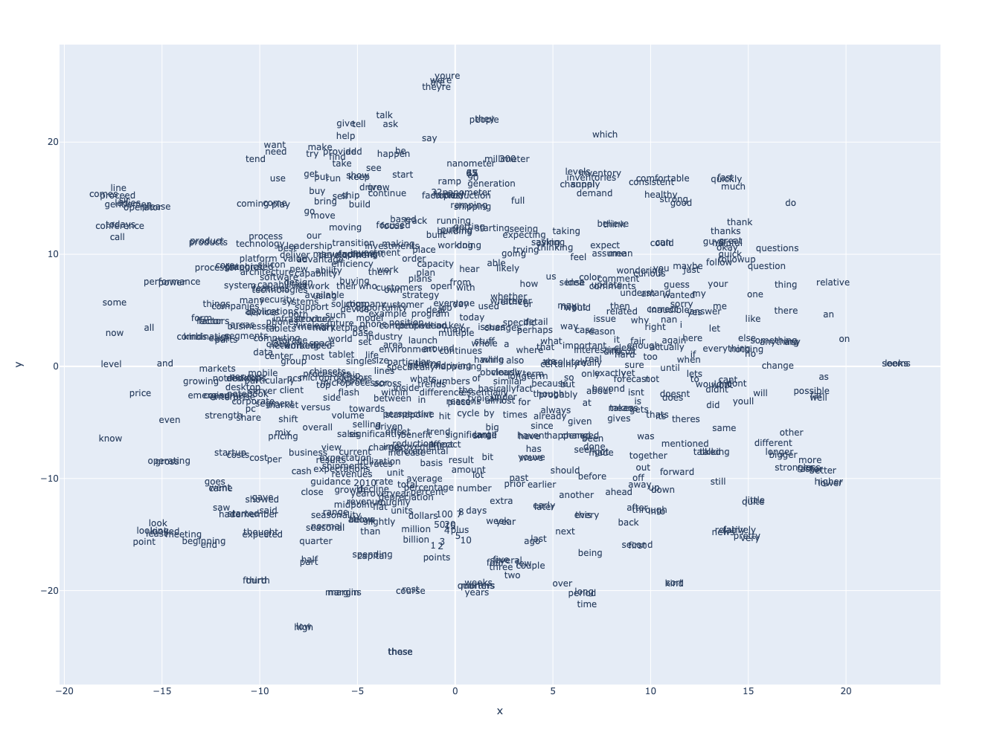

In [42]:
plot(intelmodel)

## Sentiment Analysis

In [43]:
# Get Lexicon
salex = pd.read_csv('lexicon/salex_nrc.csv').set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]

# Create polarity column
salex['polarity'] = salex.positive - salex.negative

# Columns
emo_cols = [i for i in salex.columns.values if i not in ('negative', 'positive')]

In [44]:
# Join LIB to token to add month, year, and date of transcript
SENTAnalysisTOKEN = TOKEN.merge(LIB[['file_id', 'year', 'date']],left_on='file_id', right_on='file_id')
SENTAnalysisTOKEN['month'] = SENTAnalysisTOKEN.date.map(lambda x: str(x).strip()).str.extract(pat = '([a-z]+)', flags=re.I)
SENTAnalysisTOKEN['date'] = pd.to_datetime(SENTAnalysisTOKEN['date']) 
SENTAnalysisTOKEN.head()

,file_id,company,title,speaker,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id,year,date,month
0,575f8b498cfe5b23768b45e8,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,Brent Bracelin,0,0,"('Thank', 'NNP')",NNP,Thank,thank,26308,2016,2016-05-20,May
1,575f8b498cfe5b23768b45e8,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,Brent Bracelin,0,1,"('you', 'PRP')",PRP,you,you,29413,2016,2016-05-20,May
2,575f8b498cfe5b23768b45e8,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,Brent Bracelin,0,2,"('for', 'IN')",IN,for,for,11078,2016,2016-05-20,May
3,575f8b498cfe5b23768b45e8,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,Brent Bracelin,0,3,"('taking', 'VBG')",VBG,taking,taking,25912,2016,2016-05-20,May
4,575f8b498cfe5b23768b45e8,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,Brent Bracelin,0,4,"('the', 'DT')",DT,the,the,26334,2016,2016-05-20,May


In [45]:
SENTAnalysisTOKEN = SENTAnalysisTOKEN.sort_values(by = ['date', 'company', 'title', 'speaker', 'sent_num', 'token_num'], ascending = True).set_index(['company', 'year', 'title', 'speaker', 'sent_num'])
SENTAnalysisTOKEN = SENTAnalysisTOKEN.join(salex, on='term_str', how='left')
SENTAnalysisTOKEN[emo_cols] = SENTAnalysisTOKEN[emo_cols].fillna(0.0)
SENTAnalysisTOKEN[['term_str', 'term_id'] + emo_cols].head(10)

term_str  \
company year title                                              speaker      sent_num            
Cisco   2002 Q2 2002 Scientific-Atlanta Earnings Conference ... ALLEN BEZOZO 0            yeah   
                                                                             0              hi   
                                                                             0            guys   
                                                                             1             can   
                                                                             1             you   
                                                                             1            hear   
                                                                             1              me   
                                                                             2             hey   
                                                                             2               i   
                                                                             2            dont   

                                                                                       term_id  \
company year title                                              speaker      sent_num            
Cisco   2002 Q2 2002 Scientific-Atlanta Earnings Conference ... ALLEN BEZOZO 0           29361   
                                                                             0           12636   
                                                                             0           12196   
                                                                             1            5090   
                                                                             1           29413   
                                                                             1           12524   
                                                                             1           16349   
                                                                             2           12632   
                                                                             2           13132   
                                                                             2            8834   

                                                                                       anger  \
company year title                                              speaker      sent_num          
Cisco   2002 Q2 2002 Scientific-Atlanta Earnings Conference ... ALLEN BEZOZO 0           0.0   
                                                                             0           0.0   
                                                                             0           0.0   
                                                                             1           0.0   
                                                                             1           0.0   
                                                                             1           0.0   
                                                                             1           0.0   
                                                                             2           0.0   
                                                                             2           0.0   
                                                                             2           0.0   

                                                                                       anticipation  \
company year title                                              speaker      sent_num                 
Cisco   2002 Q2 2002 Scientific-Atlanta Earnings Conference ... ALLEN BEZOZO 0                  0.0   
                                                                             0                  0.0   
                                                                             0                  0.0   
                                                                

### Sentiment Analysis Vocab table

In [46]:
# Save Sentiment Analysis Vocab table
VOCAB = pd.read_csv('dataset/processed-files/final/VOCAB.csv')
SENTAnalysisVOCAB = VOCAB.merge(SENTAnalysisTOKEN[['term_id'] + emo_cols], left_on = 'term_id', right_on = 'term_id')
SENTAnalysisVOCAB.to_csv('dataset/processed-files/final/SENTANALYSISVOCAB.csv', index=False)

In [47]:
# All years
CISCO = SENTAnalysisTOKEN.loc['Cisco'].copy()
INTEL = SENTAnalysisTOKEN.loc['Intel'].copy()
VERIZON = SENTAnalysisTOKEN.loc['Verizon'].copy()
IBM = SENTAnalysisTOKEN.loc['IBM'].copy()

# 2010
CISCO2010 = SENTAnalysisTOKEN.loc[('Cisco', 2010)].copy()
INTEL2010 = SENTAnalysisTOKEN.loc[('Intel', 2010)].copy()
VERIZON2010 = SENTAnalysisTOKEN.loc[('Verizon', 2010)].copy()
IBM2010 = SENTAnalysisTOKEN.loc[('IBM', 2010)].copy()

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:8: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:9: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:10: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:11: PerformanceWarning:

indexing past lexsort depth may impact performance.



### Bar Graph of Emotions

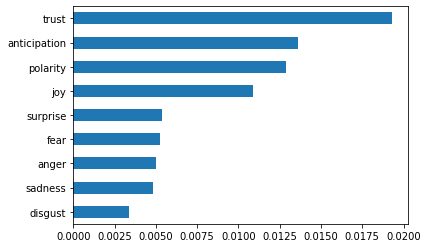

In [73]:
# All years
CISCO[emo_cols].mean().sort_values().plot.barh()

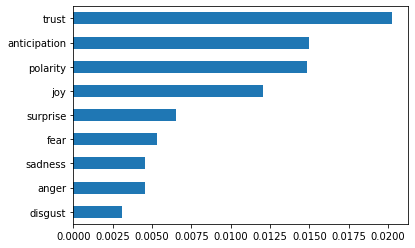

In [74]:
# 2010
CISCO2010[emo_cols].mean().sort_values().plot.barh()

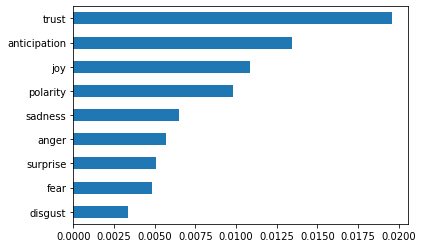

In [75]:
# All years
INTEL[emo_cols].mean().sort_values().plot.barh()

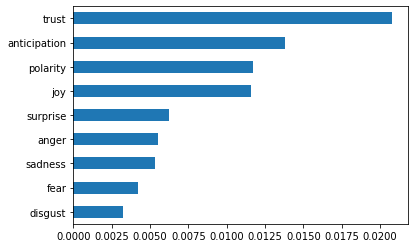

In [76]:
# 2010
INTEL2010[emo_cols].mean().sort_values().plot.barh()

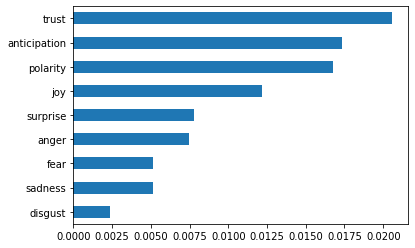

In [77]:
# All years
VERIZON[emo_cols].mean().sort_values().plot.barh()

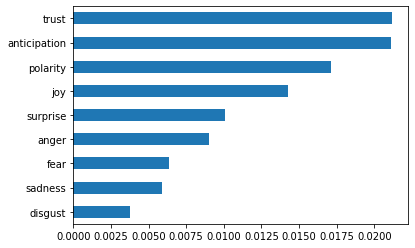

In [78]:
# 2010
VERIZON2010[emo_cols].mean().sort_values().plot.barh()

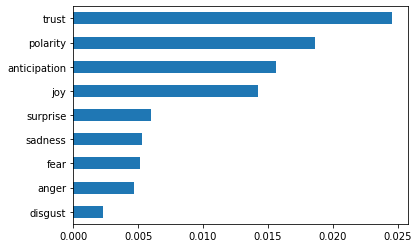

In [79]:
# All year
IBM[emo_cols].mean().sort_values().plot.barh()

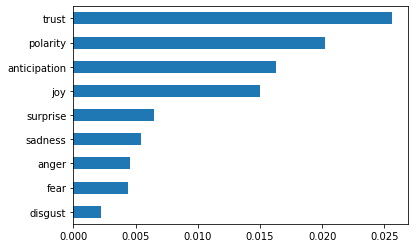

In [80]:
# 2010
IBM2010[emo_cols].mean().sort_values().plot.barh()

### Stock Prices using KDE

In [81]:
import scipy as sp
import scipy.fftpack as fftpack
from sklearn.neighbors import KernelDensity as KDE
from sklearn.preprocessing import scale

In [82]:
def get_dct_transform(raw_values, low_pass_size = 5, x_reverse_len = 100):
    if low_pass_size > len(raw_values):
        raise ValueError("low_pass_size must be less than or equal to the length of raw_values input vector")
        
    values_dct = fftpack.dct(raw_values, type = 2)
    keepers = values_dct[:low_pass_size]
    padded_keepers = list(keepers) + list(np.zeros(x_reverse_len - low_pass_size))
    dct_out = fftpack.idct(padded_keepers)
    
    return(dct_out)

In [83]:
def plot_transcripts(title, color, year = None, dct = True, low_pass_size = 5, x_reverse_len = 100, emo = 'polarity', item =1):
    global SENTAnalysisTOKEN, axes, plot_cfg
    
    if year is not None:
        X = SENTAnalysisTOKEN.loc[(title, year), emo].values
    else:
        X = SENTAnalysisTOKEN.loc[title, emo].values
        year = '2002-2017'
    if dct:
        method = 'DCT'
        X = get_dct_transform(X, low_pass_size = low_pass_size, x_reverse_len = x_reverse_len)
    else:
        method = 'FFT'
        X = get_dct_transform(X, low_pass_size = low_pass_size, x_reverse_len = x_reverse_len, padding_factor = 1)

    plot_cfg['title'] = "Company: {}\n Year: {}\n Emotion: {}".format(title, year, emo)
    pd.Series(X).plot(**plot_cfg, ax = axes[i], color = color);
    

**Stocks of 4 Companies from 2002 - 2017**

   ![alt text](2002_2017Stocks.png)

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.



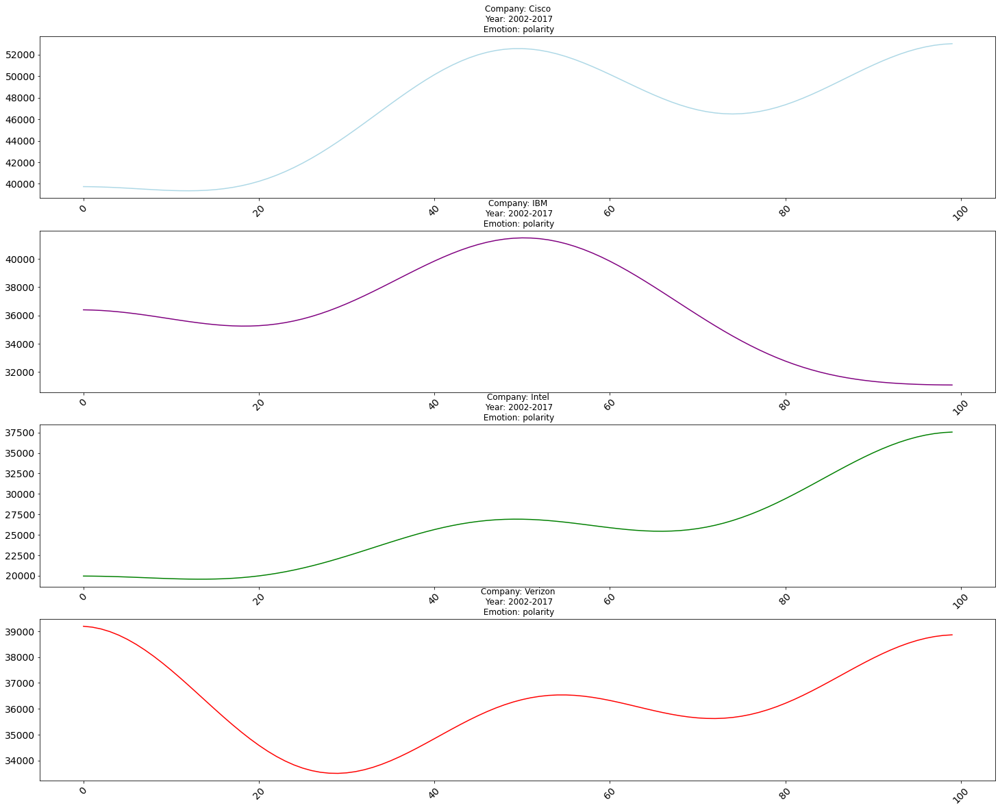

In [84]:
companies = {'Cisco', 'IBM', 'Intel', 'Verizon'}
fig, axes = plt.subplots(len(companies), 1)
colors = ['lightblue', 'purple', 'green', 'red']
plot_cfg = dict(
    figsize = (25, 5 * len(companies)),
    legend = False,
    fontsize = 14,
    rot = 45)
for i, company in enumerate(sorted(companies)):
    plot_transcripts(company, colors[i], emo = 'polarity', item = i)
fig.savefig('2002-2017 Polarity')

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.



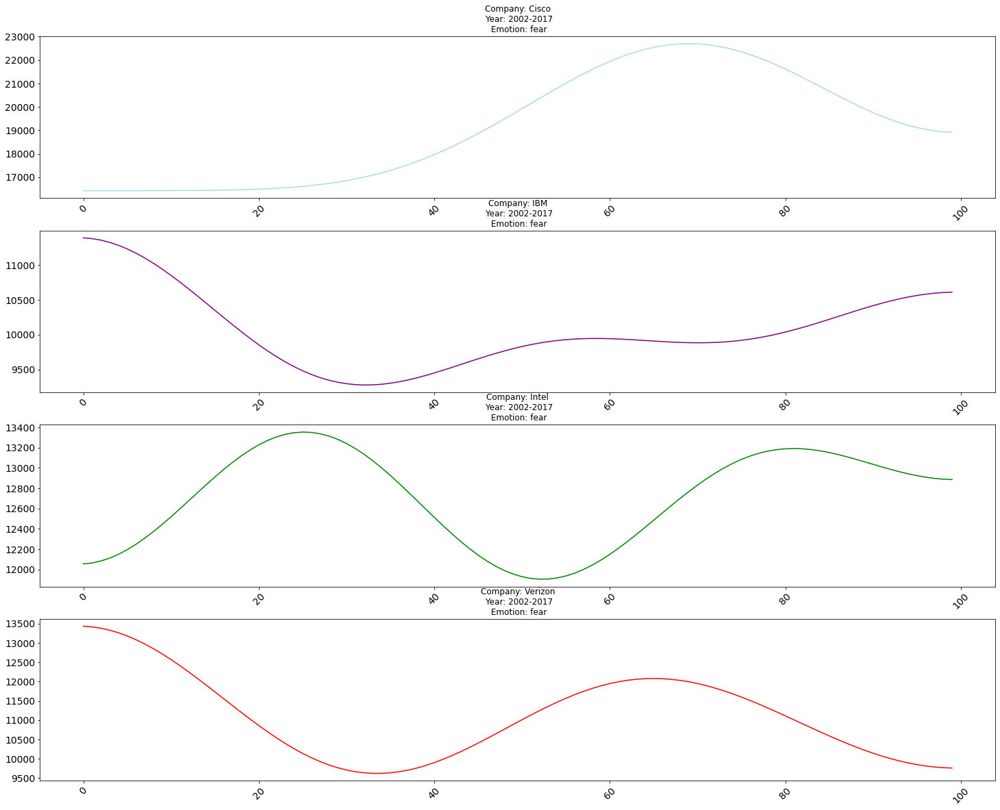

In [85]:
fig, axes = plt.subplots(len(companies), 1)
plot_cfg = dict(
    figsize = (25, 5 * len(companies)),
    legend = False,
    fontsize = 14,
    rot = 45)
for i, company in enumerate(sorted(companies)):
    plot_transcripts(company, colors[i], emo = 'fear',item = i)
fig.savefig('2002-2017 Fear')

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:7: PerformanceWarning:

indexing past lexsort depth may impact performance.



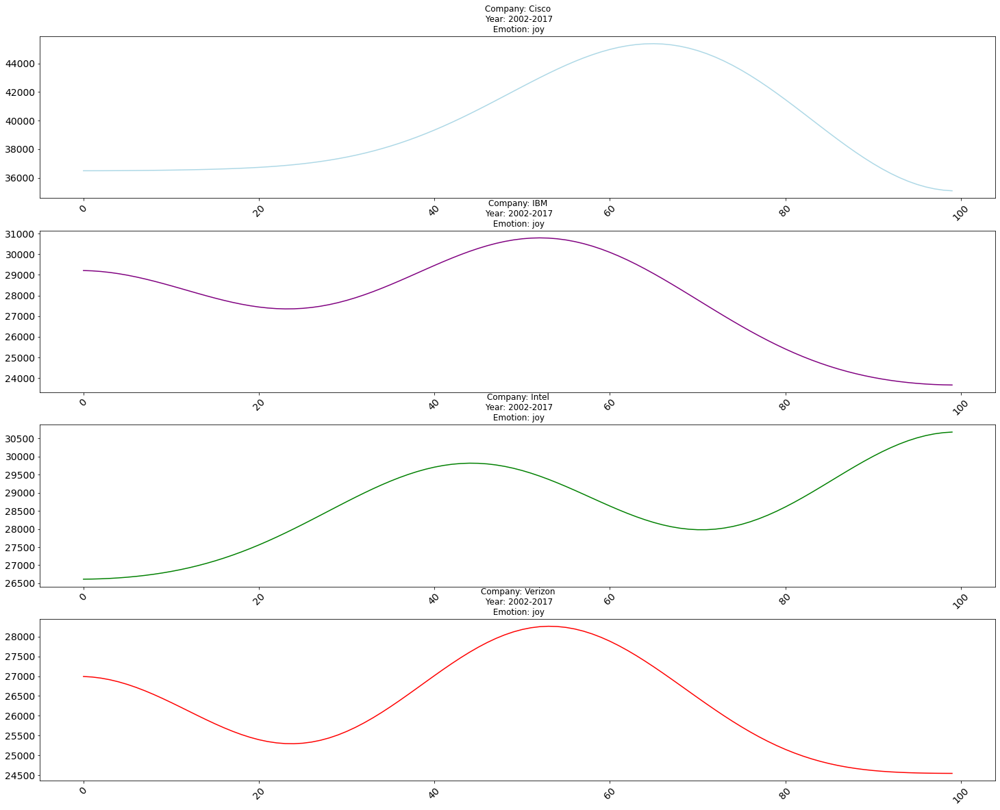

In [86]:
fig, axes = plt.subplots(len(companies), 1)
plot_cfg = dict(
    figsize = (25, 5 * len(companies)),
    legend = False,
    fontsize = 14,
    rot = 45)
for i, company in enumerate(sorted(companies)):
    plot_transcripts(company, colors[i], emo = 'joy',item = i)
fig.savefig('2002-2017 Joy')

**Stocks of 4 Companies in 2010**

   !['Stocks of 4 Companies in 2010'](2010Stocks.png)

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.



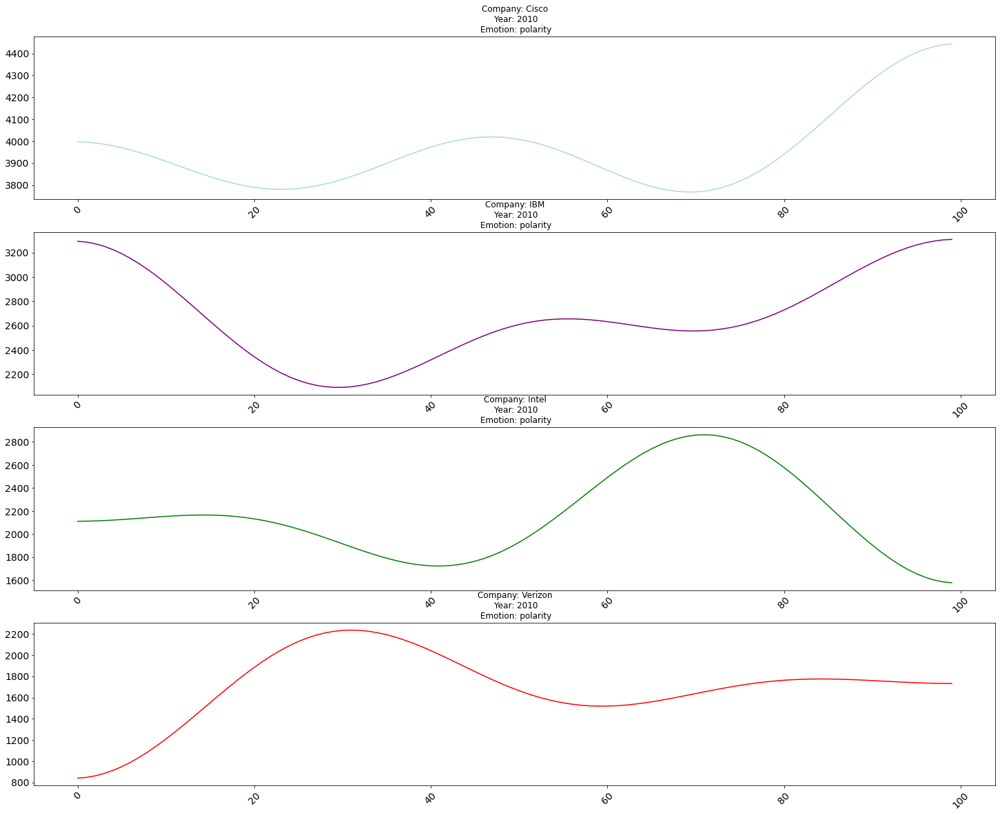

In [87]:
fig, axes = plt.subplots(len(companies), 1)
plot_cfg = dict(
    figsize = (25, 5 * len(companies)),
    legend = False,
    fontsize = 14,
    rot = 45)
for i, company in enumerate(sorted(companies)):
    plot_transcripts(company, colors[i], year = 2010, emo = 'polarity',item = i)
fig.savefig('2010 Polarity')

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.

/apps/software/standard/compiler/gcc/7.1.0/jupyter_conda/2019.10-py3.7/lib/python3.7/site-packages/pandas/core/indexing.py:1762: PerformanceWarning:

indexing past lexsort depth may impact performance.



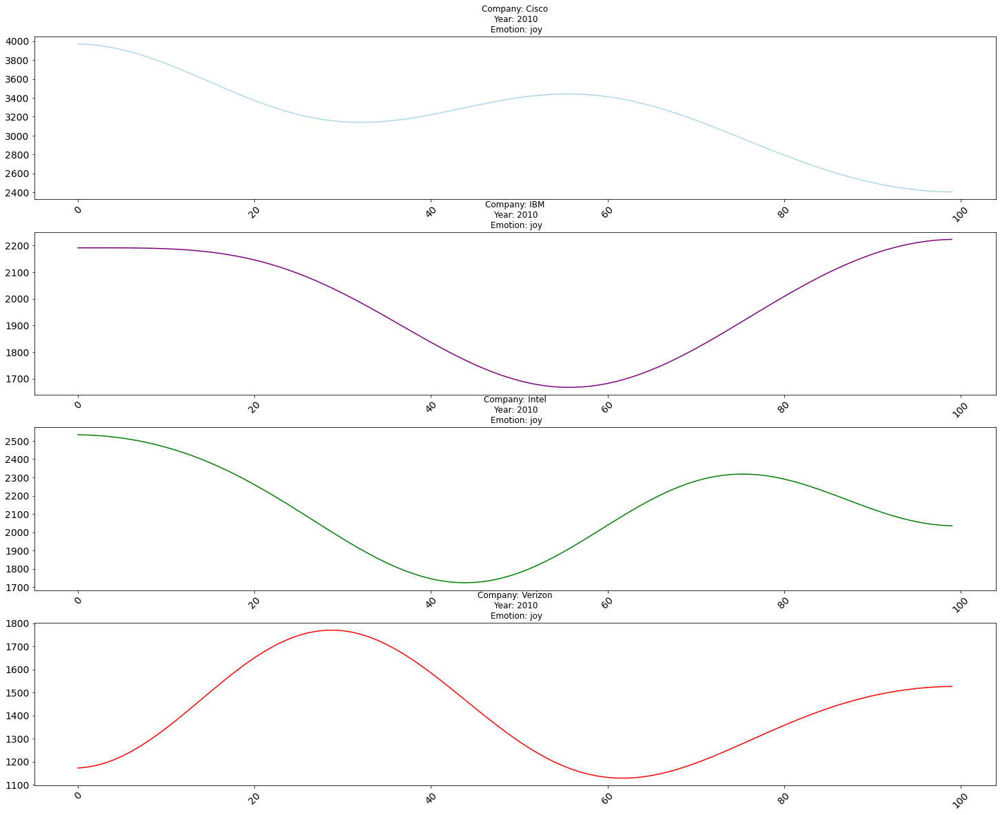

In [88]:
fig, axes = plt.subplots(len(companies), 1)
plot_cfg = dict(
    figsize = (25, 5 * len(companies)),
    legend = False,
    fontsize = 14,
    rot = 45)
for i, company in enumerate(sorted(companies)):
    plot_transcripts(company, colors[i], year = 2010, emo = 'joy',item = i)
fig.savefig('2010 Joy')

### Stock Prices using Sentiment by Company and Year

In [153]:
from matplotlib.pyplot import *
def plot_sentiments(df, color, company, year = None, emo='polarity'):
    if year is not None:
        title = 'Stocks of 4 Companies in 2010'
    else:
        title = 'Stocks of 4 Companies from 2002-2017'
    FIG2 = dict(figsize=(25, 5), legend = False, fontsize=14, rot=45, title = title)
    ax = df[emo].plot(**FIG2, color = color)
    ax.legend(['Cisco', 'IBM', 'Intel', 'Verizon']);
    

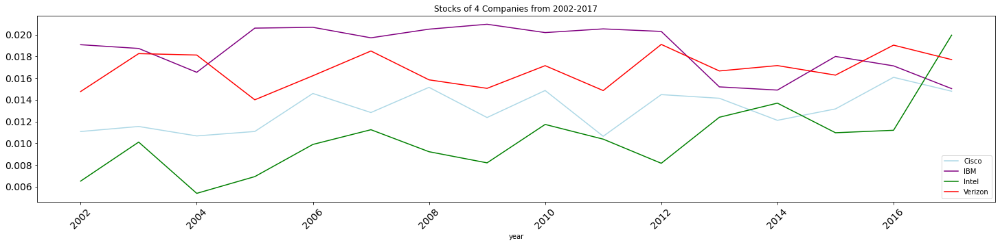

In [175]:
CISCOYEAR = CISCO.groupby(['year'])[emo_cols].mean()
IBMYEAR = IBM.groupby(['year'])[emo_cols].mean()
INTELYEAR = INTEL.groupby(['year'])[emo_cols].mean()
VERIZONYEAR = VERIZON.groupby(['year'])[emo_cols].mean()
   
plot_sentiments(CISCOYEAR, colors[0],'Cisco')
plot_sentiments(IBMYEAR, colors[1], 'IBM')
plot_sentiments(INTELYEAR, colors[2],'Intel')
plot_sentiments(VERIZONYEAR, colors[3], 'Verizon')
fig.savefig('2002-2017 Sentiment Polarity')

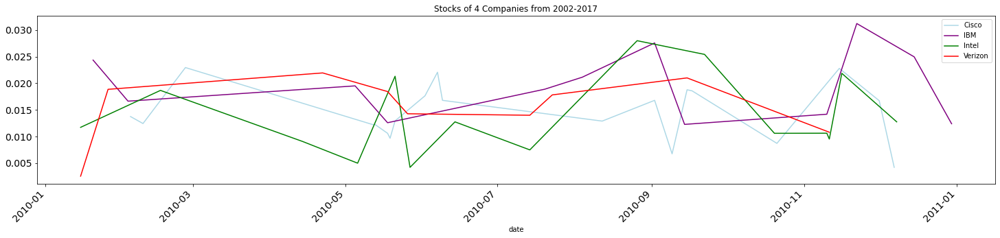

In [174]:
CISCO2010 = CISCO.loc[2010].groupby(['date'])[emo_cols].mean()
IBM2010 = IBM.loc[2010].groupby(['date'])[emo_cols].mean()
INTEL2010 = INTEL.loc[2010].groupby(['date'])[emo_cols].mean()
VERIZON2010 = VERIZON.loc[2010].groupby(['date'])[emo_cols].mean()

plot_sentiments(CISCO2010 , colors[0],'Cisco')
plot_sentiments(IBM2010, colors[1], 'IBM')
plot_sentiments(INTEL2010, colors[2],'Intel')
plot_sentiments(VERIZON2010, colors[3], 'Verizon')
fig.savefig('2010 Sentiment Polarity')

## Topic Modeling

In [402]:
n_terms = 5000
n_topics = 7
max_iter = 100

In [403]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [404]:
def ldamodel(TOKEN, year = None):
    if year is not None:
        TOKEN = TOKEN.merge(LIB[['file_id', 'year']],left_on='file_id', right_on='file_id')
        TOKEN = TOKEN.set_index(['year', 'company', 'title', 'speaker', 'sent_num'])
        TOKEN = TOKEN.loc[(year)]
        
    ## Convert Token to table of company
    companytoken = TOKEN[TOKEN.pos.str.match(r'^NNS?$')]\
        .groupby(COMPANY).term_str\
        .apply(lambda x: ' '.join(x))\
        .to_frame()\
        .rename(columns={'term_str':'speaker_str'})
    
    ## Create Vector Space
    ## We use Scikit Learn's CountVectorizer to convert our F1 corpus of company into a document-term vector space of word counts.
    tfv = CountVectorizer(max_features=n_terms, stop_words='english')
    tf = tfv.fit_transform(companytoken.speaker_str)
    TERMS = tfv.get_feature_names()
    
    # Generate Model
    # We run Scikit Learn's LatentDirichletAllocation algorithm and extract the THETA and PHI tables.
    lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=10., random_state=0)
    
    THETA = pd.DataFrame(lda.fit_transform(tf), index=companytoken.index)
    THETA.columns.name = 'topic_id'
    
    PHI = pd.DataFrame(lda.components_, columns=TERMS)
    PHI.index.name = 'topic_id'
    PHI.columns.name  = 'term_str'
    
    # Top topic term per topic
    TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)
    
    # Doc weight
    TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)
    TOPICS['doc_weight_sum'] = THETA.sum()
    return THETA, PHI, TOPICS

In [406]:
# All years
THETA, PHI, TOPICS = ldamodel(TOKEN)

In [407]:
THETA.head().style.background_gradient()

,topic_id,0,1,2,3,4,5,6
file_id,company,,,,,,,
575f8b498cfe5b23768b45e8,Cisco,0.000132,0.506792,0.000132,0.220941,0.000132,0.033792,0.238080
575f8b708cfe5b23768b4c08,Cisco,0.000159,0.157129,0.081527,0.000159,0.039596,0.000159,0.721271
575f8b988cfe5beb7f8b458b,Cisco,0.001914,0.001915,0.335903,0.001913,0.654529,0.001912,0.001914
575f8be58cfe5beb7f8b4e28,Verizon,0.533621,0.000859,0.037726,0.096141,0.329933,0.000860,0.000860
575f8bfe8cfe5beb7f8b5088,Cisco,0.133896,0.052784,0.185991,0.025321,0.488103,0.006404,0.107501


In [408]:
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6
term_str,,,,,,,
004,10.142745,0.142857,0.142879,0.142899,0.142882,0.142857,0.142881
005,0.143778,0.142871,0.142907,12.141745,0.142857,0.142974,0.142868
006,4.382680,0.145633,0.142924,2.899389,0.143029,0.142972,0.143373
010,8.259076,0.142869,0.144586,7.024094,0.142950,0.143250,0.143174
012,8.028492,0.142869,0.142916,2.257050,0.142857,0.142960,0.142857


In [409]:
# 2010
THETA2010, PHI2010, TOPICS2010 = ldamodel(TOKEN, 2010)

In [410]:
THETA2010.head().style.background_gradient()

,topic_id,0,1,2,3,4,5,6
file_id,company,,,,,,,
575fb9058cfe5b225d8b554c,Cisco,0.000124,0.000124,0.000124,0.000124,0.000124,0.999254,0.000124
575fb9058cfe5b225d8b554d,Cisco,0.000124,0.000124,0.000124,0.000124,0.000124,0.999254,0.000124
575fdce38cfe5b39368b7b85,IBM,0.000212,0.000212,0.000212,0.000212,0.998728,0.000212,0.000212
575fdce38cfe5b39368b7b86,IBM,0.000212,0.000212,0.000212,0.000212,0.998728,0.000212,0.000212
575fdea38cfe5b39368b8776,Verizon,0.000125,0.000125,0.000125,0.000125,0.999250,0.000125,0.000125


In [411]:
PHI2010.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6
term_str,,,,,,,
003,0.142857,0.142857,0.142857,0.142857,2.142857,0.142857,0.142857
005,0.142857,0.142857,0.142857,0.142857,4.142857,0.142857,0.142857
008,0.142857,0.142857,0.142857,0.142857,2.142857,0.142857,0.142857
010,0.142857,0.142857,0.142857,0.142857,2.142857,0.142857,0.142857
012,0.142857,0.142857,0.142857,0.142857,2.142857,0.142857,0.142857


### Top Topic Terms per Topic 

In [412]:
# All years
TOPICS

term_str,0,1,2,3,4,5,6,7,8,9,label,doc_weight_sum
topic_id,,,,,,,,,,,,
0,year,quarter,question,customers,lot,business,network,time,growth,thanks,0 year quarter question customers lot business...,238.286142
1,terms,quarter,growth,question,market,business,bit,year,service,time,1 terms quarter growth question market busines...,150.530559
2,market,technology,performance,years,time,people,power,today,devices,product,2 market technology performance years time peo...,103.569978
3,quarter,business,growth,year,question,revenue,performance,services,software,half,3 quarter business growth year question revenu...,159.148871
4,question,customers,quarter,okay,time,customer,number,product,kind,lot,4 question customers quarter okay time custome...,131.651195
5,quarter,year,question,bit,inventory,business,line,margin,terms,half,5 quarter year question bit inventory business...,168.808905
6,data,network,business,customers,lot,things,services,market,way,service,6 data network business customers lot things s...,241.004351


In [413]:
# 2010
TOPICS2010

term_str,0,1,2,3,4,5,6,7,8,9,label,doc_weight_sum
topic_id,,,,,,,,,,,,
0,customers,network,market,things,technology,question,lot,data,today,business,0 customers network market things technology q...,14.100203
1,application,source,developers,questions,work,environment,set,tools,question,answer,1 application source developers questions work...,2.697751
2,market,video,tv,network,product,question,lot,people,power,way,2 market video tv network product question lot...,6.181491
3,partners,time,technology,business,kind,product,question,yes,services,customers,3 partners time technology business kind produ...,7.267857
4,quarter,growth,year,business,revenue,lot,performance,question,rate,half,4 quarter growth year business revenue lot per...,21.161037
5,quarter,growth,terms,year,market,business,question,bit,time,enterprise,5 quarter growth terms year market business qu...,16.368791
6,year,quarter,question,line,bit,inventory,kind,business,thanks,margin,6 year quarter question line bit inventory kin...,10.222869


#### Sort Topics by Doc Weight

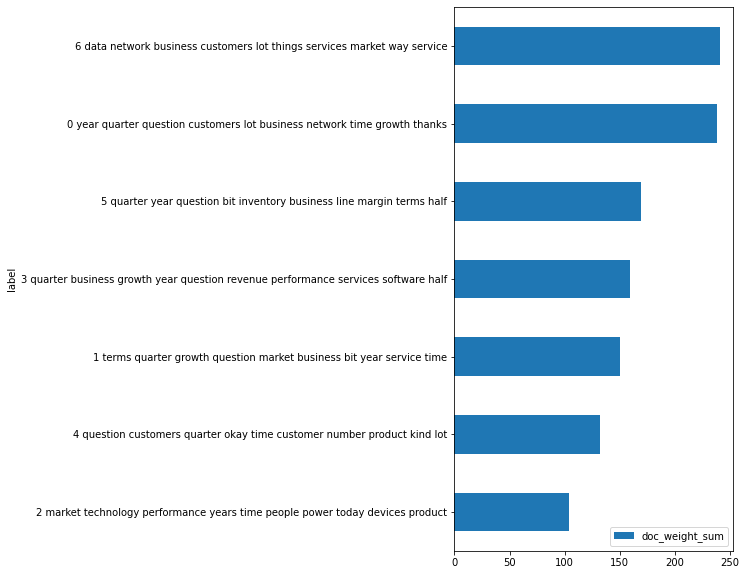

In [414]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

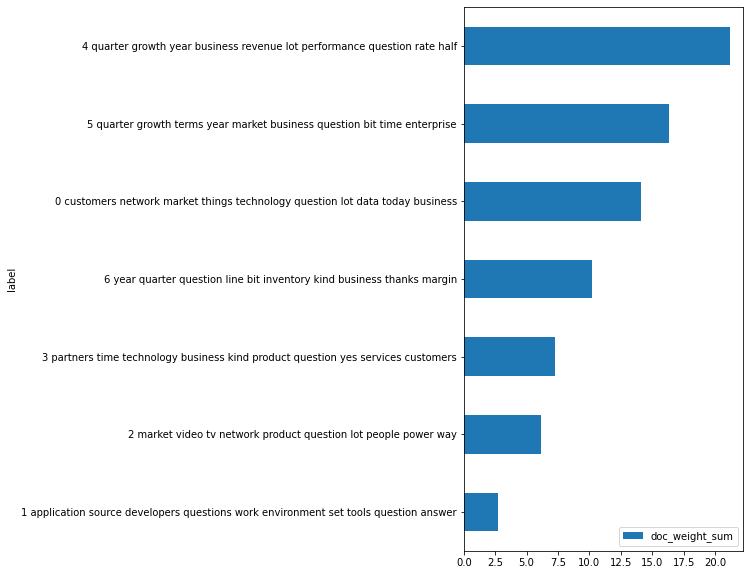

In [415]:
TOPICS2010.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

#### Explore by Company

In [416]:
topic_cols = [t for t in range(n_topics)]
COMPANIES = THETA.reset_index().groupby('company')[topic_cols].mean().T
COMPANIES.index.name = 'topic_id'
COMPANIES['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)
COMPANIES.style.background_gradient()

company,Cisco,IBM,Intel,Verizon,topterms
topic_id,,,,,
0,0.031278,0.034807,0.041588,0.726087,year quarter question customers lot business network time growth thanks
1,0.348013,0.027119,0.013255,0.016737,terms quarter growth question market business bit year service time
2,0.057570,0.022456,0.249631,0.031135,market technology performance years time people power today devices product
3,0.034567,0.510237,0.016900,0.042606,quarter business growth year question revenue performance services software half
4,0.153081,0.163389,0.049452,0.061837,question customers quarter okay time customer number product kind lot
5,0.022561,0.034951,0.551398,0.013968,quarter year question bit inventory business line margin terms half
6,0.352932,0.207041,0.077775,0.107629,data network business customers lot things services market way service


In [417]:
topic_cols = [t for t in range(n_topics)]
COMPANIES2010 = THETA2010.reset_index().groupby('company')[topic_cols].mean().T
COMPANIES2010.index.name = 'topic_id'
COMPANIES2010['topterms'] = TOPICS2010[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)
COMPANIES2010.style.background_gradient()

company,Cisco,IBM,Intel,Verizon,topterms
topic_id,,,,,
0,0.327679,0.196299,0.050234,0.108905,customers network market things technology question lot data today business
1,0.000235,0.000198,0.106762,0.017923,application source developers questions work environment set tools question answer
2,0.089381,0.000198,0.167886,0.006326,market video tv network product question lot people power way
3,0.038563,0.000198,0.232957,0.072492,partners time technology business kind product question yes services customers
4,0.042982,0.661444,0.035627,0.617117,quarter growth year business revenue lot performance question rate half
5,0.498572,0.076740,0.024690,0.156310,quarter growth terms year market business question bit time enterprise
6,0.002588,0.064923,0.381844,0.020929,year quarter question line bit inventory kind business thanks margin


In [418]:
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

In [419]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 432x288 with 0 Axes>

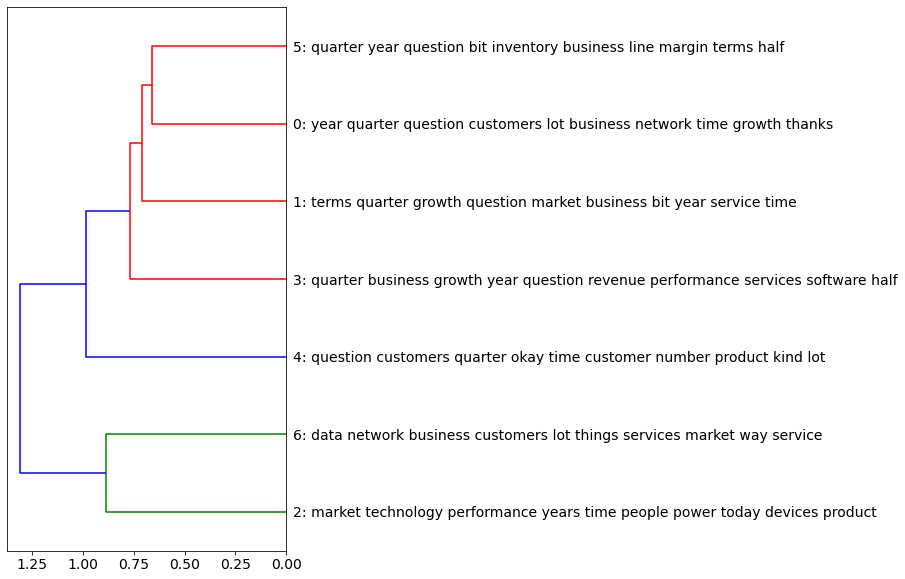

In [420]:
SIMS = pdist(normalize(PHI), metric='euclidean')
TREE = sch.linkage(SIMS, method='ward')
labels  = ["{}: {}".format(a,b) for a, b in zip(COMPANIES.index,  COMPANIES.topterms.tolist())]
plot_tree(TREE, labels)

<Figure size 432x288 with 0 Axes>

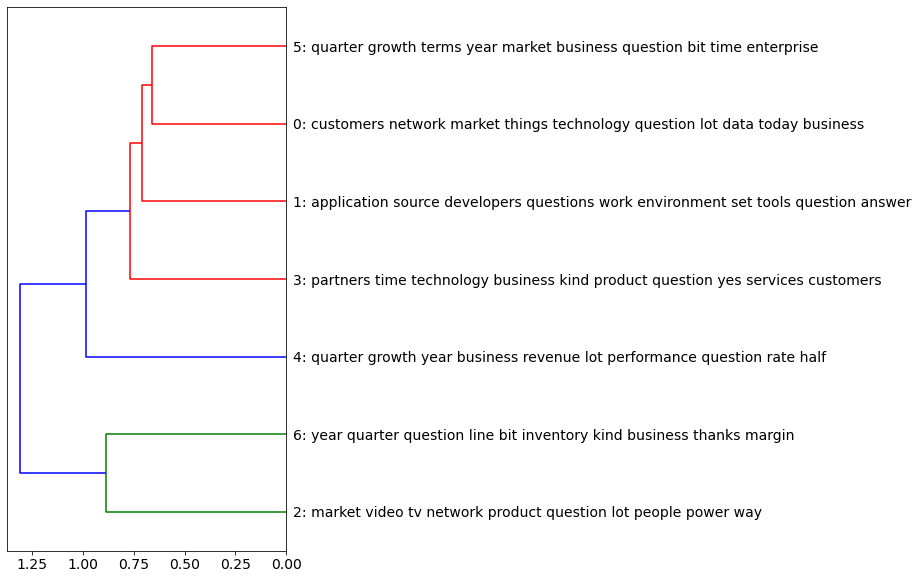

In [421]:
SIMS2010 = pdist(normalize(PHI2010), metric='euclidean')
TREE2010 = sch.linkage(SIMS, method='ward')
labels2010  = ["{}: {}".format(a,b) for a, b in zip(COMPANIES2010.index,  COMPANIES2010.topterms.tolist())]
plot_tree(TREE2010, labels2010)

In [432]:
term_topic = PHI.T.merge(VOCAB[['term_str', 'term_id']], on='term_str')
term_topic = term_topic[['term_id', 'term_str', 0, 1, 2, 3, 4, 5, 6]]
term_topic.to_csv('dataset/processed-files/final/TERMTOPIC.csv', index = False)

In [441]:
THETA.reset_index().drop('company', axis=1).to_csv('dataset/processed-files/final/DOCTOPIC.csv', index = False)

In [442]:
len(LIB)

1193

In [443]:
LIB

,file_id,file_name,company,title,date,year
0,575f8b498cfe5b23768b45e8,Cisco/575f8b498cfe5b23768b45e8_CSCO.txt,Cisco,Q3 2016 Cisco Systems Inc Earnings Call,"May 20, 2016",2016
1,575f8b708cfe5b23768b4c08,Cisco/575f8b708cfe5b23768b4c08_CSCO.txt,Cisco,Cisco Systems Inc at Bank of America Merrill L...,"Jun 2, 2016",2016
2,575f8b988cfe5beb7f8b458b,Cisco/575f8b988cfe5beb7f8b458b_CSCO.txt,Cisco,Scientific-Atlanta Inc. at The Brean Murray & ...,"Feb 2, 2005",2005
3,575f8bfe8cfe5beb7f8b5088,Cisco/575f8bfe8cfe5beb7f8b5088_CSCO.txt,Cisco,Scientific-Atlanta Inc. 2005 Financial Analyst...,"Apr 6, 2005",2005
4,575f8c218cfe5beb7f8b53aa,Cisco/575f8c218cfe5beb7f8b53aa_CSCO.txt,Cisco,Cisco Systems at Nasdaq/Morgan Stanley 14th In...,"Feb 25, 2005",2005
...,...,...,...,...,...,...
1188,588767f66bfe09de158b4567,Verizon/588767f66bfe09de158b4567_VZ.txt,Verizon,Q4 2016 Verizon Communications Inc Earnings Call,"Feb 27, 2017",2017
1189,58b6c3536bfe092b038b4567,Verizon/58b6c3536bfe092b038b4567_VZ.txt,Verizon,Verizon Communications Inc at Morgan Stanley T...,"Mar 1, 2017",2017
1190,58f8b88f6bfe097d038b4567,Verizon/58f8b88f6bfe097d038b4567_VZ.txt,Verizon,Q1 2017 Verizon Communications Inc Earnings Call,"Apr 21, 2017",2017
1191,5911266a6bfe09c7088b4567,Verizon/5911266a6bfe09c7088b4567_VZ.txt,Verizon,Verizon Communications Inc Analyst Meeting Web...,"May 10, 2017",2017
